In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scanpy as sc
from scipy import stats
import os

from scipy import spatial
from scipy import sparse
from scipy.interpolate import CubicSpline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import networkx as nx
from umap import UMAP
from scipy.stats import zscore

import json

In [2]:
import importlib

from scroutines import powerplots
from scroutines.miscu import is_in_polygon

import utils_merfish
importlib.reload(utils_merfish)
from utils_merfish import rot2d, st_scatter, st_scatter_ax, plot_cluster, binning
from utils_merfish import RefLineSegs

import merfish_datasets
import merfish_genesets
importlib.reload(merfish_datasets)
from merfish_datasets import merfish_datasets
from merfish_datasets import merfish_datasets_params

from scroutines import basicu

In [3]:
def get_qc_metrics(df):
    """
    return metrics
     - key
      - (name, val, medval, bins)
    """
    metrics = {}
    cols  = ['volume', 'gncov', 'gnnum']
    names = ['cell volume', 'num transcripts', 'num genes']
    
    for col, name in zip(cols, names):
        val = df[col].values
        medval = np.median(val)
        bins = np.linspace(0, 10*medval, 50)
        
        metrics[col] = (name, val, medval, bins)
    return metrics

def get_norm_counts(adata, scaling=500):
    """norm - equalize the volume to be 500 for all cells
    """
    cnts = adata.X
    vol = adata.obs['volume'].values
    normcnts = cnts/vol.reshape(-1,1)*scaling
    adata.layers['norm'] = normcnts
    
    return normcnts

In [4]:
def add_triangle(XC, ax, zorder=0, vertices=False, **kwargs):
    # add the triangle
    ax.plot(XC[0].tolist()+[XC[0,0]], XC[1].tolist()+[XC[1,0]], '--',  color='gray', label='', zorder=zorder, linewidth=1, markersize=3)
    
    # add vertices
    if vertices:
        ax.scatter(XC[0,0], XC[1,0], color='C0', zorder=zorder, **kwargs)
        ax.scatter(XC[0,1], XC[1,1], color='C1', zorder=zorder, **kwargs)
        ax.scatter(XC[0,2], XC[1,2], color='C2', zorder=zorder, **kwargs)

In [5]:
def binning_pipe(adata, n=20, layer='lnorm', bin_type='depth_bin'):
    """
    """
    assert bin_type in ['depth_bin', 'width_bin']
    # bin it 
    depth_bins, depth_binned = utils_merfish.binning(adata.obs['depth'].values, n)
    width_bins, width_binned = utils_merfish.binning(adata.obs['width'].values, n)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['depth_bin'] = depth_binned
    norm_['width_bin'] = width_binned
    
    norm_mean = norm_.groupby(bin_type).mean(numeric_only=True)
    norm_sem  = norm_.groupby(bin_type).sem(numeric_only=True)
    norm_std  = norm_.groupby(bin_type).std(numeric_only=True)
    norm_n    = norm_[bin_type].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, depth_binned, width_binned, depth_bins, width_bins

def binning_pipe2(adata, col_to_bin, layer, bins=None, n=20):
    """
    """
    if bins is None:
        # bin it 
        bins, binned = utils_merfish.binning(adata.obs[col_to_bin].values, n)
    else:
        binned = pd.cut(adata.obs[col_to_bin].values, bins=bins)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['thebin'] = binned
    
    norm_mean = norm_.groupby('thebin').mean(numeric_only=True)
    norm_sem  = norm_.groupby('thebin').sem(numeric_only=True)
    norm_std  = norm_.groupby('thebin').std(numeric_only=True)
    norm_n    = norm_['thebin'].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, binned, bins 

# load data and construct adata 

In [6]:
np.random.seed(0)

In [7]:
ddir = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized" 
fin = os.path.join(ddir, 'P28NRDR_v1l23glut_rna_merfish_240729.h5ad')
!ls $ddir/*l2*240723.h5ad 

/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DRa_ant_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DRa_pos_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DRb_ant_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28DRb_pos_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28NRa_ant_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28NRa_pos_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28NRb_ant_l2_v1_240723.h5ad
/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/P28NRb_pos_l2_v1_240723.h5ad


In [8]:
adata_merge = ad.read(fin)
adata_snrnasq = adata_merge[adata_merge.obs['modality']=='rna']
adata_merfish = adata_merge[adata_merge.obs['modality']=='merfish'] 

adata_merge, adata_snrnasq, adata_merfish

(AnnData object with n_obs × n_vars = 9615 × 361
     obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'Doublet Score', 'cluster', 'Class_broad', 'sample', 'Age', 'subclass', 'sample_new', 'layer', 'Type', 'Subclass', 'modality', 'EntityID', 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'PolyT_raw', 'PolyT_high_pass', 'DAPI_raw', 'DAPI_high_pass', 'gncov', 'gnnum', 'fpcov', 'x', 'y', 'blended_domains', 'x2', 'y2', 'depth', 'width', 'norm_transcript_count', 'jnorm_transcript_count', 'depth_show', 'width_show', 'leiden_r0.3', 'umap1', 'umap2', 'umap1_self', 'umap2_self', 'max_pred', 'frac_self_neighbors', 'gated_pred', 'max_pred_subclass', 'frac_self_neighbors_subclass', 'gated_pred_subclass'
     uns: 'neighbors', 'umap'
     obsm: 'X_pca', 'X_pca2', 'X_pca_harmony', 'X_umap', 'X_xy', 'blanks', 'pca', 'umap'
     layers: 'jnorm', 'ljnorm', 'lognorm', 'norm'
     obsp: 'conn

In [9]:
%%time
names = [
    'P28NRa_ant', 
    'P28NRa_pos',
    
    'P28NRb_ant', 
    'P28NRb_pos',
    
    'P28DRa_ant', 
    'P28DRa_pos',
    
    'P28DRb_ant', 
    'P28DRb_pos',
]

alldata = {}
for name in names:
    adatasub = ad.read(os.path.join(ddir, f'{name}_l2_v1_240723.h5ad')) 
    adatasub.obs.index = np.char.add(f'{name}', adatasub.obs.index.values)
    alldata[name] = adatasub 
    print(name, len(alldata[name]))
    
genes = adatasub.var.index.values
genes.shape

P28NRa_ant 4875
P28NRa_pos 9816
P28NRb_ant 2984
P28NRb_pos 12329
P28DRa_ant 5986
P28DRa_pos 7733
P28DRb_ant 10244
P28DRb_pos 8207
CPU times: user 700 ms, sys: 934 ms, total: 1.63 s
Wall time: 9.43 s


(500,)

In [10]:
genesets, df = merfish_genesets.get_all_genesets()
for key, item in genesets.items():
    print(key, len(item))

a 64
b 35
c 71
i 16
a_up 14


In [11]:
agenes = genesets['a']
bgenes = genesets['b']
cgenes = genesets['c']
iegs   = genesets['i']
abcgenes = np.hstack([agenes, bgenes, cgenes])
genes_noniegs = np.array([g for g in genes if g not in iegs])

marker_genes = [
       'Ptprn', 'Slc17a7', 'Gad1', 'Fos', 
       
       'Gfap', 'Slc6a13', 'Slc47a1',
       'Grin2c', 'Aqp4', 'Rfx4', 'Sox21', 'Slc1a3',
       
       'Sox10', 'Pdgfra', 'Mog',
       
       'Pecam1', 'Cd34' , 'Tnfrsf12a', 'Sema3c', 
       'Zfhx3', 'Pag1', 'Slco2b1', 'Cx3cr1',
      ] 
len(abcgenes), len(genes_noniegs)

(170, 484)

In [12]:
agenes_idx = basicu.get_index_from_array(adatasub.var.index.values, agenes)
bgenes_idx = basicu.get_index_from_array(adatasub.var.index.values, bgenes)
cgenes_idx = basicu.get_index_from_array(adatasub.var.index.values, cgenes)
igenes_idx = basicu.get_index_from_array(adatasub.var.index.values, iegs)

# get L2/3 glut cells only

In [13]:
l23_cells = adata_merfish[adata_merfish.obs['gated_pred_subclass']=='L2/3'].obs.index.values

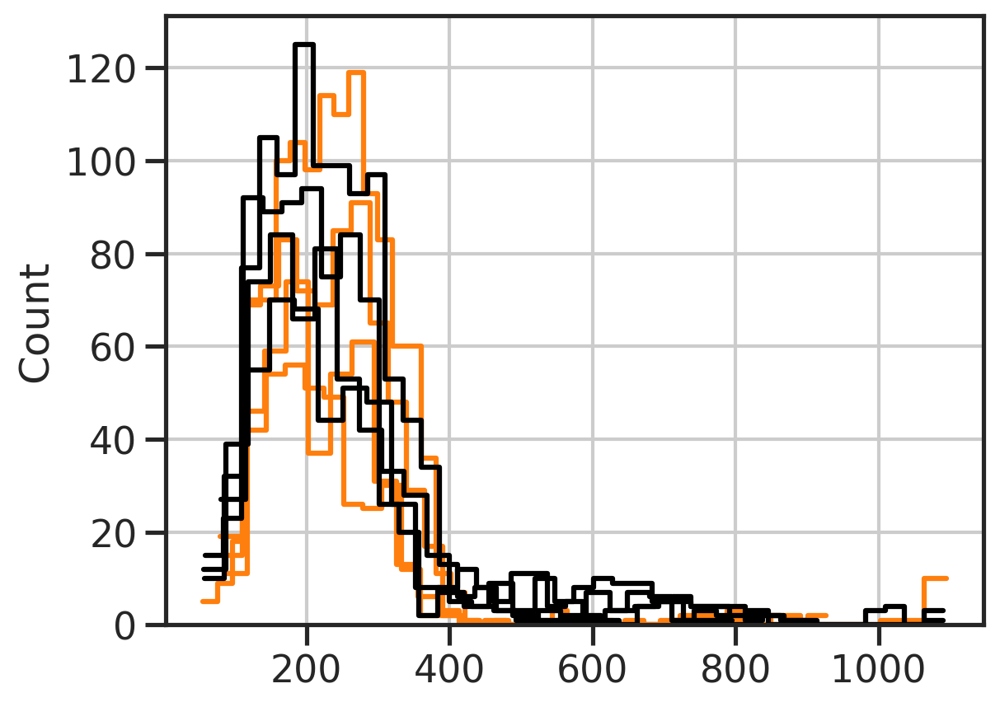

In [14]:
colors = ['C1', 'k']
for i, name in enumerate(names):
    j = i // 4
    color = colors[j]
    
    adatasub = alldata[name]
    l23_cellssub = np.intersect1d(l23_cells, adatasub.obs.index.values)
    adatasub = adatasub[l23_cellssub].copy()
    sns.histplot(adatasub.obs['depth'].values, element='step', fill=False, color=color)

In [15]:
mean_total_rna_target = 250
adata_merged = []
for i, name in enumerate(names):
    j = i // 4
    i = i % 4
    
    adatasub = alldata[name].copy()
    adatasub.obs['sample'] = name
    
    
    # get L2/3 glut and make sure they are 400 or below
    l23_cellssub = np.intersect1d(l23_cells, adatasub.obs.index.values)
    adatasub = adatasub[l23_cellssub]
    adatasub = adatasub[adatasub.obs['depth'] < 400]
    
    
    norm_cnts = adatasub.layers['norm']
    # mean_per_batch = np.mean(norm_cnts.sum(axis=1))
    mean_per_batch_noniegs = np.mean(adatasub[:,genes_noniegs].layers['norm'].sum(axis=1))
    
    adatasub.layers['jnorm']  = norm_cnts*(mean_total_rna_target/mean_per_batch_noniegs)
    adatasub.layers['ljnorm'] = np.log2(1+adatasub.layers['jnorm'])
    
    adatasub.obs['norm_transcript_count']  = adatasub.layers['norm'].sum(axis=1)
    adatasub.obs['jnorm_transcript_count'] = adatasub.layers['jnorm'].sum(axis=1)
    
    adatasub.obs['depth_show'] = -adatasub.obs['depth'].values - i*1300 # name
    adatasub.obs['width_show'] =  adatasub.obs['width'].values - np.min(adatasub.obs['width'].values) + j*2500   # name
    
    adata_merged.append(adatasub)
    
adata_l23 = ad.concat(adata_merged)

In [16]:
adata = adata_l23

In [17]:
ns = adata.obs.groupby('sample').size()
ls = adata.obs.groupby('sample')['width'].max() - adata.obs.groupby('sample')['width'].min()

ns/ls

sample
P28DRa_ant    0.201286
P28DRa_pos    0.263912
P28DRb_ant    0.433676
P28DRb_pos    0.484030
P28NRa_ant    0.366171
P28NRa_pos    0.398820
P28NRb_ant    0.362401
P28NRb_pos    0.580979
dtype: float64

<BarContainer object of 8 artists>

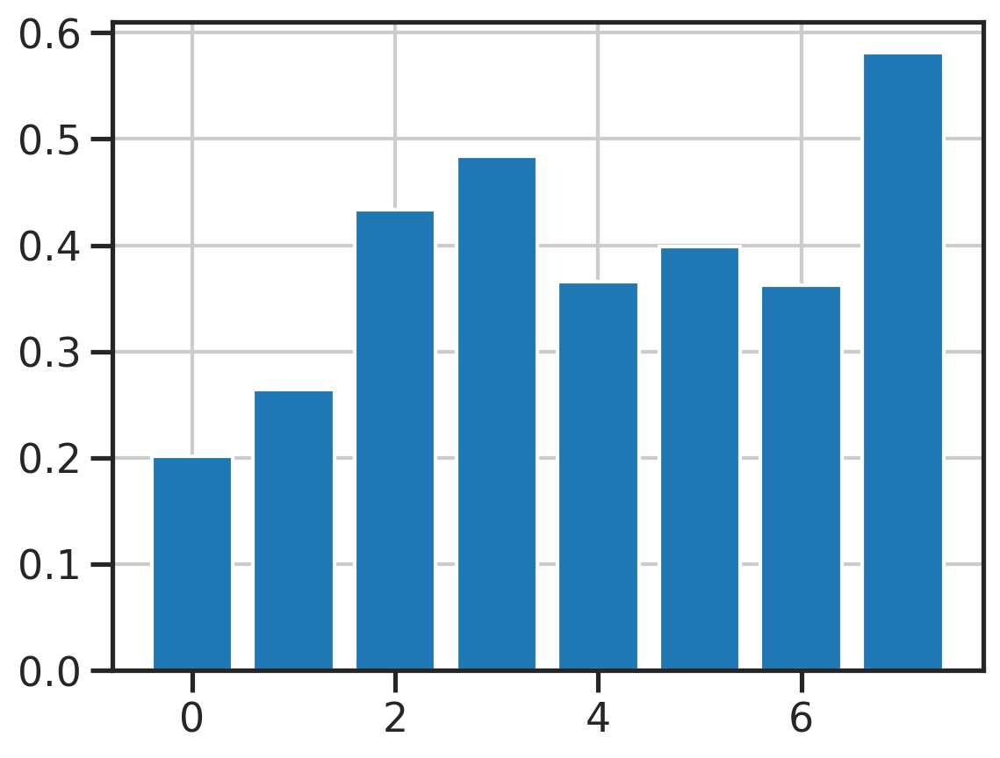

In [18]:
plt.bar(np.arange(8), ns/ls)

In [19]:
width_min = adata.obs.groupby('sample')['width'].min().reindex(names)
width_max = adata.obs.groupby('sample')['width'].max().reindex(names)
width_rng = width_max - width_min 
width_cum = pd.Series(np.cumsum(np.hstack([0, width_rng[:-1]+100])), index=names)

adata.obs['width_n0'] = adata.obs['width'] - width_min.reindex(adata.obs['sample']).values
adata.obs['width_show2'] =  adata.obs['width_n0'] + width_cum.reindex(adata.obs['sample']).values
adata.obs['depth_show2'] = -adata.obs['depth']

In [20]:
mat = adata[:,abcgenes].layers['ljnorm']
mat = stats.zscore(mat, axis=0)

mat_nr = adata[adata.obs['sample'].str.contains('NR'), abcgenes].layers['ljnorm']
mat_nr = stats.zscore(mat_nr, axis=0)

pca = PCA(n_components=5)
pcs_typegenes = pca.fit(mat).transform(mat)
# pcs_typegenes = pca.fit(mat_nr).transform(mat)
adata.obsm['pcs_typegenes'] = pcs_typegenes

In [21]:
xi, yi = 0, 1
xsign, ysign = 1, 1

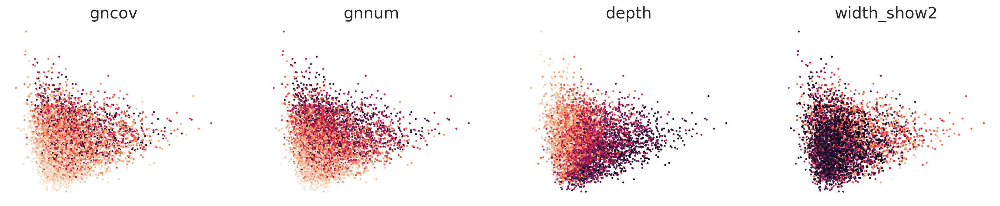

In [22]:
metrics = ['gncov', 'gnnum', 'depth', 'width_show2']

fig, axs = plt.subplots(1,4,figsize=(4*5,1*4))
for metric, ax in zip(metrics, axs):
    # g = np.log10(1+adata.obs[metric])
    g = adata.obs[metric]
    x = xsign*adata.obsm['pcs_typegenes'][:,xi]
    y = ysign*adata.obsm['pcs_typegenes'][:,yi]
    utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, )
    ax.set_title(metric)

In [23]:
xi, yi = 0, 2
xsign, ysign = 1,1

In [24]:
%%time

from py_pcha import PCHA

np.random.seed(0)

X = np.vstack([
    xsign*adata.obsm['pcs_typegenes'][:,xi], 
    ysign*adata.obsm['pcs_typegenes'][:,yi], 
])

# X = np.vstack([
#     xsign*adata[adata.obs['sample'].str.contains('NR')].obsm['pcs_typegenes'][:,xi], 
#     ysign*adata[adata.obs['sample'].str.contains('NR')].obsm['pcs_typegenes'][:,yi], 
# ])


XC, S, C, SSE, varexpl = PCHA(X, noc=3, delta=0)
XC = np.array(XC)
XC = XC[:,np.argsort(XC[0])].copy() # order this
print(XC.shape, S.shape, C.shape, SSE.shape, varexpl.shape, SSE, varexpl)




(2, 3) (3, 5227) (5227, 3) () () 82.98698969435645 0.9982637153262467
CPU times: user 5.23 s, sys: 1.88 ms, total: 5.23 s
Wall time: 5.3 s


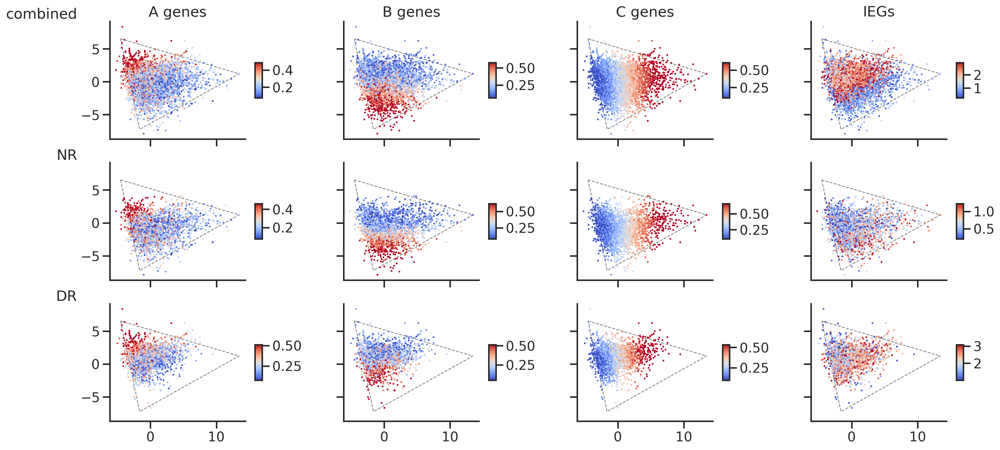

In [25]:
gns = [agenes, bgenes, cgenes, iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].mean(axis=1)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, cmap='coolwarm', vmin_p=5, vmax_p=95)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        # add the triangle
        add_triangle(XC, ax)
plt.show()

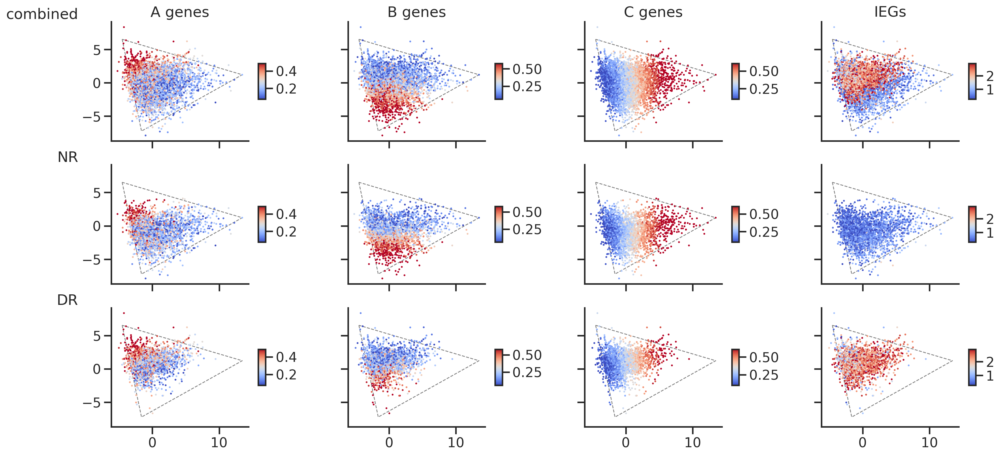

In [26]:
gns = [agenes, bgenes, cgenes, iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].mean(axis=1)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        # consistent over
        g0 = adata[:,gn].layers['ljnorm'].mean(axis=1)
        vmin = np.percentile(g0,  5)
        vmax = np.percentile(g0, 95)
            
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, cmap='coolwarm', vmin=vmin, vmax=vmax)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        # add the triangle
        add_triangle(XC, ax)
plt.show()

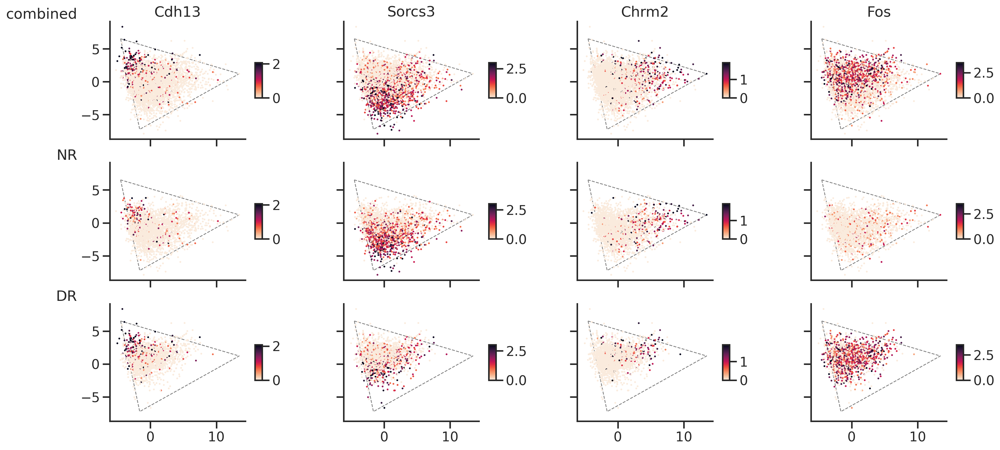

In [27]:
gns = ['Cdh13', 'Sorcs3', 'Chrm2', 'Fos']
titles = gns
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].reshape(-1,)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        # consistent over
        g0 = adata[:,gn].layers['ljnorm'].mean(axis=1)
        vmin = np.percentile(g0,  5)
        vmax = np.percentile(g0, 99)
            
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, vmin=vmin, vmax=vmax)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        add_triangle(XC, ax)
plt.show()

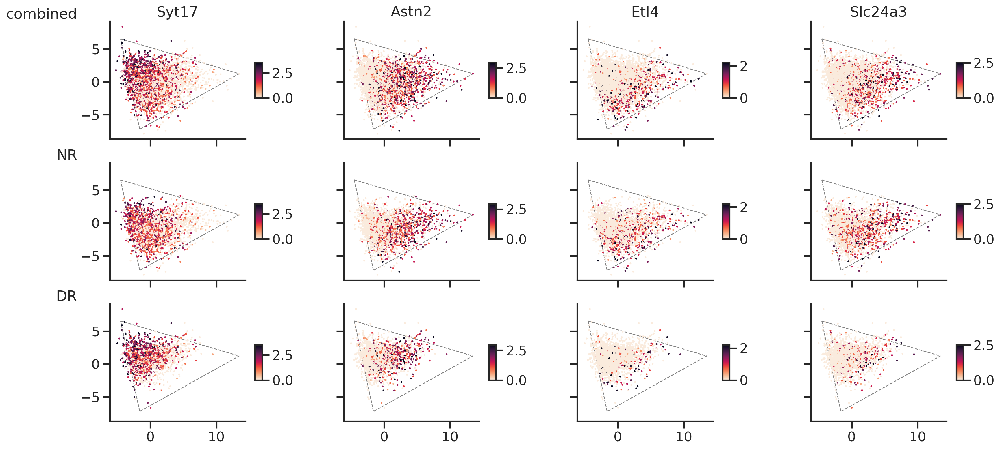

In [28]:
gns = ['Syt17', 'Astn2', 'Etl4', 'Slc24a3'] 
titles = gns
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axss = plt.subplots(3,4,figsize=(4*5,3*3), sharex=True, sharey=True)
for i, (axs, adatasub, condition) in enumerate(zip(axss, adatas, conditions)):
    condition = conditions[i]
    for j, (ax, gn, title,) in enumerate(zip(axs, gns, titles)):
        g = adatasub[:,gn].layers['ljnorm'].reshape(-1,)
        x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
        y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
        
        # consistent over
        g0 = adata[:,gn].layers['ljnorm'].mean(axis=1)
        vmin = np.percentile(g0,  5)
        vmax = np.percentile(g0, 99)
            
        p = utils_merfish.st_scatter_ax(fig, ax, x, y, gexp=g, s=5, vmin=vmin, vmax=vmax)
        colorbar = plt.colorbar(p, aspect=5, shrink=0.3)
        
        # Show ticks but no grid
        ax.set_aspect('equal')
        ax.axis('on')
        ax.grid(False)  # Turn off grid lines
        sns.despine(ax=ax)
        ax.tick_params(axis='both', which='both', bottom=True, left=True)
        
        if i == 0:
            ax.set_title(title)
        if j == 0:
            ax.set_ylabel(condition, rotation=0, loc='top')
            
        add_triangle(XC, ax)
plt.show()

# customized colormap 

In [29]:
from matplotlib.colors import LinearSegmentedColormap

colors_a = [(0.0, 'black'), (1.0, 'C0')]      
colors_b = [(0.0, 'black'), (1.0, 'C1')]      
colors_c = [(0.0, 'black'), (1.0, 'C2')]      
colors_nrdr = [(0.0, 'C1'), (0.5, 'white'), (1.0, 'black')]
colors_nr = [(0.0, 'white'), (1.0, 'C1'),]
colors_dr = [(0.0, 'white'), (1.0, 'black'),]

# Create a custom colormap using LinearSegmentedColormap
cmap_a = LinearSegmentedColormap.from_list('cmap_a', colors_a)
cmap_b = LinearSegmentedColormap.from_list('cmap_b', colors_b)
cmap_c = LinearSegmentedColormap.from_list('cmap_c', colors_c)
cmap_nrdr = LinearSegmentedColormap.from_list('cmap_nrdr', colors_nrdr)
cmap_nr = LinearSegmentedColormap.from_list('cmap_nr', colors_nr)
cmap_dr = LinearSegmentedColormap.from_list('cmap_dr', colors_dr)

[-12. -11. -10.  -9.  -8.  -7.  -6.  -5.  -4.  -3.  -2.  -1.   0.   1.
   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.]
[-7. -6. -5. -4. -3. -2. -1.  0.  1.  2.  3.  4.  5.  6.  7.]
(24, 14)
(24, 14)
(24, 14)


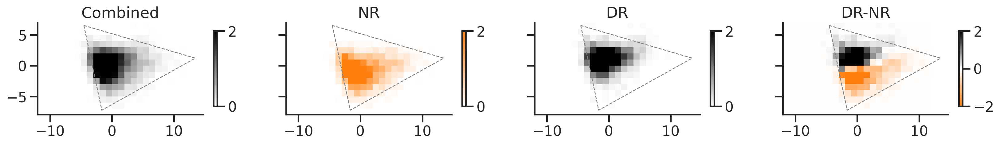

In [30]:
xmin, xmax = -12, 12
ymin, ymax = -7, 7 

bins_x = np.linspace(xmin, xmax, 1*(xmax-xmin)+1)
bins_y = np.linspace(ymin, ymax, 1*(ymax-ymin)+1)
print(bins_x)
print(bins_y)

hists = []
fig, axs = plt.subplots(1,4,figsize=(4*5,1*4), sharex=True, sharey=True)
for ax, adatasub, cond, _cmap in zip(axs, [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
    ], 
    ['Combined', 'NR', 'DR'], 
    ['gray_r', cmap_nr, cmap_dr]):
    x =  xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y =  ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    sns.histplot(x=x, y=y, ax=ax, bins=(bins_x, bins_y), 
                 cmap=_cmap, # 'gray_r', 
                 stat='percent', vmin=0, vmax=2, 
                 cbar=True, cbar_kws=dict(shrink=0.4, ticks=[0,2]))
    # sns.kdeplot(x=x, y=y, ax=ax, bins=(bins_x, bins_y))
    
    hist, _, _= np.histogram2d(x, y, bins=(bins_x, bins_y))
    hist = hist/len(x)*100
    hists.append(hist)
    print(hist.shape)
    ax.set_title(cond)
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.grid(False)
    
    # g = ax.imshow(pd.DataFrame(np.log2(1e-3+hist), 
    #                          index=bins_x[1:]-0.5, 
    #                          columns=bins_y[1:]-0.5).T, 
    #             origin='lower',
    #             extent=(xmin, xmax, ymin, ymax),
    #             cmap='gray_r') # , vmax=1, vmin=-1)
    
    # add the triangle
    add_triangle(XC, ax, zorder=2)
    
ax = axs[3] 
ax.set_title('DR-NR')
g = ax.imshow(
    # pd.DataFrame(np.log2(1e-3+hists[2])-np.log2(1e-3+hists[1]), #-hists[1], 
    pd.DataFrame(hists[2]-hists[1], #-hists[1], 
                         index=bins_x[1:]-0.5, 
                         columns=bins_y[1:]-0.5).T, 
            origin='lower',
            extent=(xmin, xmax, ymin, ymax),
            # cmap='coolwarm', 
            cmap=cmap_nrdr, 
            vmax=2, vmin=-2)
# ax.invert_yaxis()
ax.set_aspect('equal')
ax.grid(False)
fig.colorbar(g, shrink=0.4, ticks=[-2,0,2])
sns.despine(ax=ax)

# add the triangle
add_triangle(XC, ax, zorder=2)

plt.show()

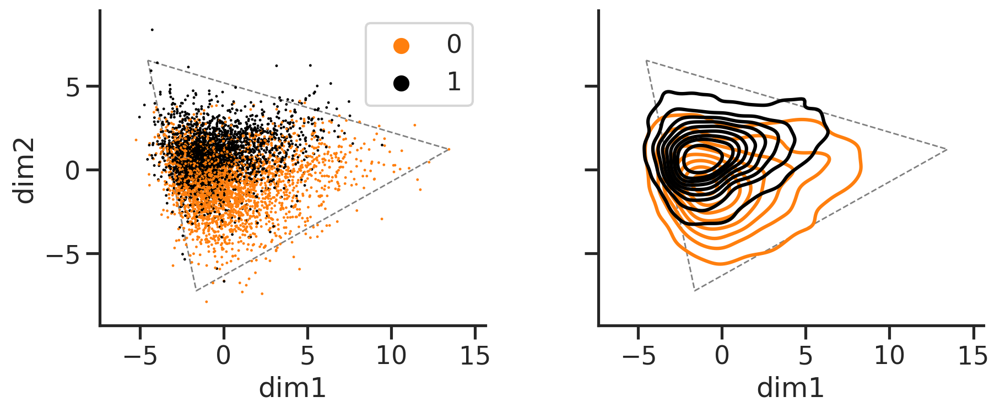

In [31]:
dfshow = adata.obs.copy()
dfshow['nrdr'] = dfshow['sample'].str.contains('DR').astype(int)
dfshow['dim1'] = xsign*adata.obsm['pcs_typegenes'][:,xi]
dfshow['dim2'] = ysign*adata.obsm['pcs_typegenes'][:,yi]
palette = {0: 'C1', 1: 'black'}


fig, axs = plt.subplots(1,2,figsize=(2*5,1*4), sharex=True, sharey=True) 
ax = axs[0]
add_triangle(XC, ax)
sns.scatterplot(data=dfshow.sample(frac=1), x='dim1', y='dim2', hue='nrdr', s=3, edgecolor='none', palette=palette, ax=ax)
ax.set_aspect('equal')
sns.despine(ax=ax)
ax.grid(False)
ax.legend(bbox_to_anchor=(1,1))

ax = axs[1]
add_triangle(XC, ax)
sns.kdeplot(data=dfshow, x='dim1', y='dim2', hue='nrdr', palette=palette, legend=False, ax=ax,)
ax.set_aspect('equal')
sns.despine(ax=ax)
ax.grid(False)


fig.tight_layout()
plt.show()

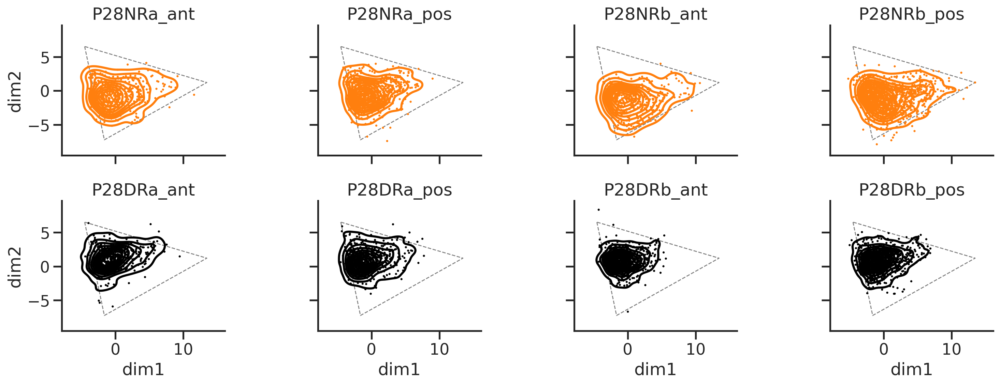

In [32]:
fig, axs = plt.subplots(2,4,figsize=(4*4,2*3), sharex=True, sharey=True) 
for sample, ax in zip(names, axs.flat):
    add_triangle(XC, ax)
    sns.scatterplot(data=dfshow[dfshow['sample']==sample].sample(frac=1), 
                    x='dim1', y='dim2', hue='nrdr', s=5, edgecolor='none', palette=palette, ax=ax, legend=False)
    sns.kdeplot(data=dfshow[dfshow['sample']==sample],
                x='dim1', y='dim2', hue='nrdr', palette=palette, legend=False, ax=ax,)
    ax.set_aspect('equal')
    sns.despine(ax=ax)
    ax.set_title(sample)
    ax.grid(False)
    # ax.legend(bbox_to_anchor=(1,1))

fig.tight_layout()
plt.show()

# customized colormap 

In [33]:
from matplotlib.colors import LinearSegmentedColormap

colors_a = [(0.0, 'black'), (1.0, 'C0')]      
colors_b = [(0.0, 'black'), (1.0, 'C1')]      
colors_c = [(0.0, 'black'), (1.0, 'C2')]      

# Create a custom colormap using LinearSegmentedColormap
cmap_a = LinearSegmentedColormap.from_list('cmap_a', colors_a)
cmap_b = LinearSegmentedColormap.from_list('cmap_b', colors_b)
cmap_c = LinearSegmentedColormap.from_list('cmap_c', colors_c)


In [34]:
# get ABC scores
g0_a = adata[:,agenes].layers['ljnorm'].mean(axis=1)
g0_b = adata[:,bgenes].layers['ljnorm'].mean(axis=1)
g0_c = adata[:,cgenes].layers['ljnorm'].mean(axis=1)

# make ABC scores comparable and norm to [0,1] [50% to 95%]
vmin_p, vmax_p = 50, 95
vmin_a = np.percentile(g0_a, vmin_p)
vmax_a = np.percentile(g0_a, vmax_p)

vmin_b = np.percentile(g0_b, vmin_p)
vmax_b = np.percentile(g0_b, vmax_p)

vmin_c = np.percentile(g0_c, vmin_p)
vmax_c = np.percentile(g0_c, vmax_p)

g0_a = np.clip((g0_a-vmin_a)/(vmax_a-vmin_a), 0, 1)
g0_b = np.clip((g0_b-vmin_b)/(vmax_b-vmin_b), 0, 1)
g0_c = np.clip((g0_c-vmin_c)/(vmax_c-vmin_c), 0, 1)

# separate them into scale and frequency
g0_sum  = (g0_a+g0_b+g0_c)
g0_size = np.clip(g0_sum/np.percentile(g0_sum, 50), 0, 1) # [0 - > 50%] - [0, 1]
freq0_a = g0_a/(g0_sum+1e-5)
freq0_b = g0_b/(g0_sum+1e-5)
freq0_c = g0_c/(g0_sum+1e-5)

adata.obs['raw_score_a'] = adata[:,agenes].layers['ljnorm'].mean(axis=1)
adata.obs['raw_score_b'] = adata[:,bgenes].layers['ljnorm'].mean(axis=1)
adata.obs['raw_score_c'] = adata[:,cgenes].layers['ljnorm'].mean(axis=1)

adata.obsm['size_freq_abc'] = np.vstack([g0_size, freq0_a, freq0_b, freq0_c, g0_sum]).T

# ABC scores - expression level distributions

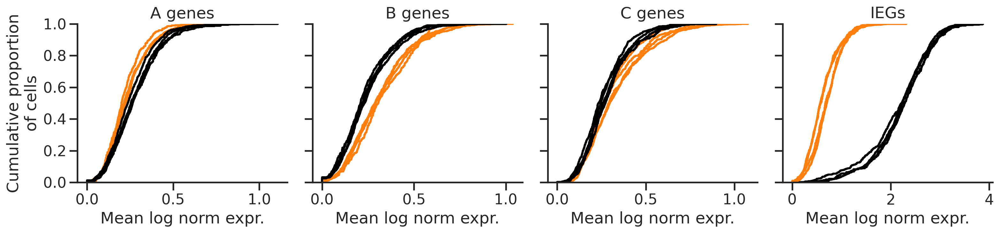

In [35]:
fig, axs = plt.subplots(1,4, figsize=(4*4,4), sharex=False, sharey=True)
for ax, genegroup, title in zip(axs, 
                                [agenes, bgenes, cgenes, iegs], 
                                ['A genes', 'B genes', 'C genes', 'IEGs'],
                               ):
    for i, sample in enumerate(names):
        scores_ = adata[adata.obs['sample']==sample][:,genegroup].layers['ljnorm'].mean(axis=1)
        if 'NR' in sample:
            color = 'C1'
        elif 'DR' in sample:
            color = 'black'

        sns.ecdfplot(scores_, ax=ax, color=color)#, complementary=True) # , linewidth=2)
        
        # _x = np.percentile(scores_, 50)
        # _y = 0.5
        # ax.text(_x, _y, i, fontsize=10, color='red')
    ax.set_ylabel('Cumulative proportion\nof cells')
    ax.set_xlabel('Mean log norm expr.')
    ax.set_title(title)
    sns.despine(ax=ax)
    ax.grid(False)
    

fig.tight_layout()
plt.show()

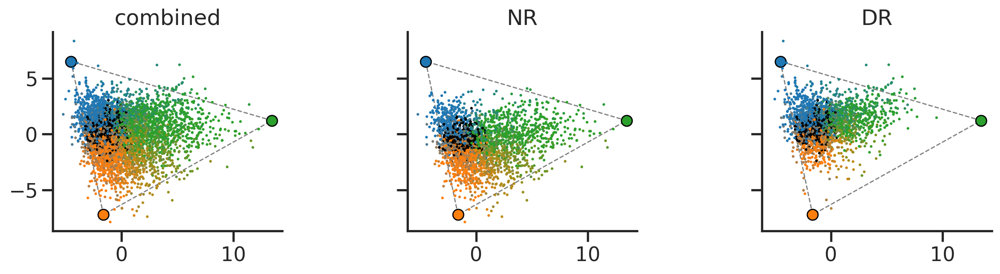

In [36]:
adatas = [
    adata,
    adata[adata.obs['sample'].str.contains('NR')],
    adata[adata.obs['sample'].str.contains('DR')],
]
conditions = ['combined', 'NR', 'DR']

fig, axs = plt.subplots(1,3,figsize=(3*5,1*3), sharex=True, sharey=True)
for i, (ax, adatasub, condition) in enumerate(zip(axs, adatas, conditions)):
    condition = conditions[i]
    x = xsign*adatasub.obsm['pcs_typegenes'][:,xi]
    y = ysign*adatasub.obsm['pcs_typegenes'][:,yi]
    
    g_size = adatasub.obsm['size_freq_abc'][:,0]
    freq_a = adatasub.obsm['size_freq_abc'][:,1]
    freq_b = adatasub.obsm['size_freq_abc'][:,2]
    freq_c = adatasub.obsm['size_freq_abc'][:,3]
    
    # visualize ABC scores using additive blending
    additive = (cmap_a(freq_a)+cmap_b(freq_b)+cmap_c(freq_c))[:,:3]
    p = ax.scatter(x, y, c=additive, s=5, edgecolor='none') # , alpha=g_size)
        
    # Show ticks but no grid
    ax.set_aspect('equal')
    ax.axis('on')
    ax.grid(False)  # Turn off grid lines
    sns.despine(ax=ax)
    ax.tick_params(axis='both', which='both', bottom=True, left=True)
    ax.set_title(condition)

    # add the triangle
    add_triangle(XC, ax, vertices=True, edgecolors='k', linewidths=1, marker='o')
    # break
# plt.show()

In [37]:
res = []
for sample in names:
    if 'NR' in sample:
        cond = 'NR'
    elif 'DR' in sample:
        cond = 'DR'
        
    adatasub = adata[adata.obs['sample']==sample]
    g_size = adatasub.obsm['size_freq_abc'][:,0]
    g_sum  = adatasub.obsm['size_freq_abc'][:,4]
    freq_a = adatasub.obsm['size_freq_abc'][:,1]
    freq_b = adatasub.obsm['size_freq_abc'][:,2]
    freq_c = adatasub.obsm['size_freq_abc'][:,3]

    # ta = np.sum(g_size*(freq_a))
    # tb = np.sum(g_size*(freq_b))
    # tc = np.sum(g_size*(freq_c))
    ta = np.sum(g_sum*(freq_a))
    tb = np.sum(g_sum*(freq_b))
    tc = np.sum(g_sum*(freq_c))
    tt = (ta+tb+tc)
    # print(sample, f'{ta/tt: .2f}', f'{tb/tt: .2f}', f'{tc/tt: .2f}')
    res.append([sample, cond, ta/tt*100, tb/tt*100, tc/tt*100, ta, tb, tc, tt])
    
res = pd.DataFrame(res, columns=['sample', 'cond', 'A', 'B', 'C', 'tA', 'tB', 'tC', 'tt']).set_index('sample')
res

,cond,A,B,C,tA,tB,tC,tt
sample,,,,,,,,
P28NRa_ant,NR,27.381308,39.438020,33.180672,75.619429,108.916659,91.635633,276.171721
P28NRa_pos,NR,27.882441,41.790867,30.326692,129.951777,194.774824,141.343709,466.070310
P28NRb_ant,NR,18.056542,44.396118,37.547340,46.501498,114.334515,96.696673,257.532686
P28NRb_pos,NR,23.970809,38.613223,37.415968,208.563524,335.963200,325.546213,870.072938
P28DRa_ant,DR,46.599464,23.171252,30.229284,117.083903,58.219138,75.952861,251.255903
P28DRa_pos,DR,47.444942,24.191901,28.363156,143.165703,72.999363,85.586177,301.751244
P28DRb_ant,DR,43.447982,30.081424,26.470594,150.897567,104.474671,91.934034,347.306272
P28DRb_pos,DR,44.925345,28.579329,26.495326,266.672947,169.644416,157.273953,593.591316


In [38]:
for i in range(3):
    print(stats.ttest_ind(res.iloc[:4,1+i], res.iloc[4:,1+i]))

Ttest_indResult(statistic=-8.755067617630605, pvalue=0.00012295566016534205)
Ttest_indResult(statistic=6.870852659033189, pvalue=0.0004684218592705637)
Ttest_indResult(statistic=3.4161465812979053, pvalue=0.014210853113759985)


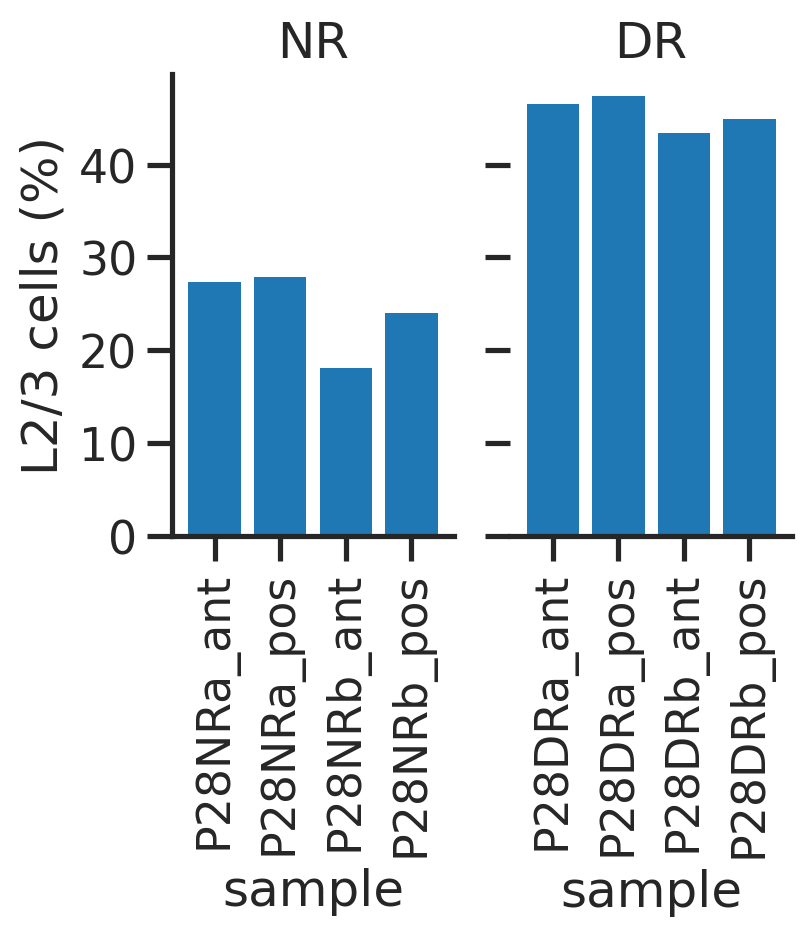

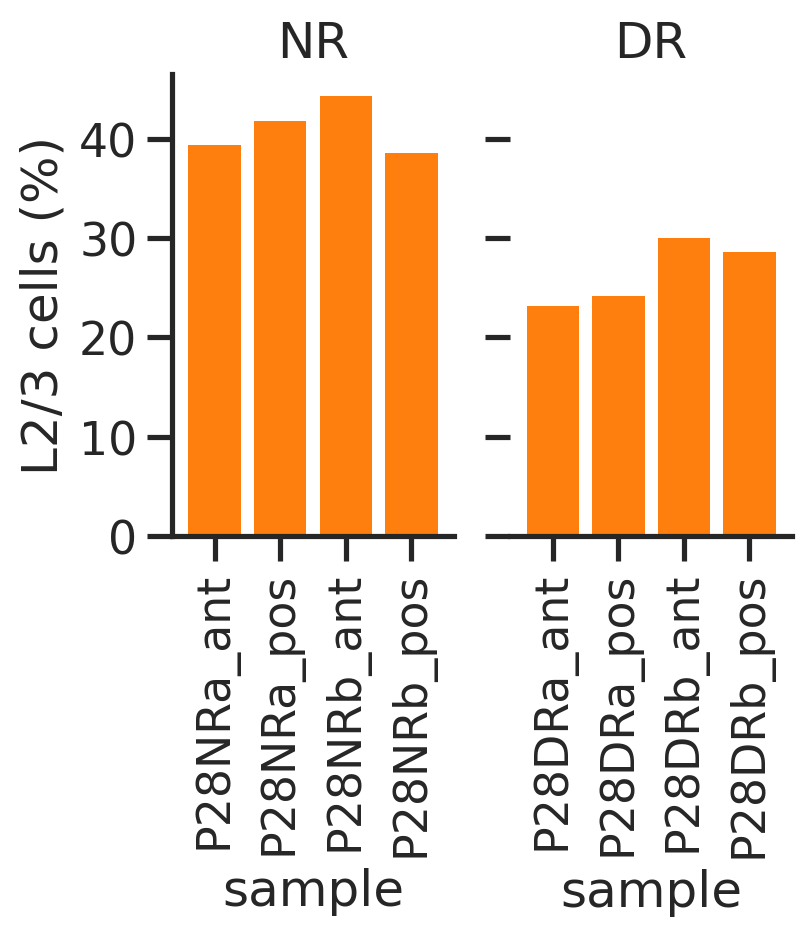

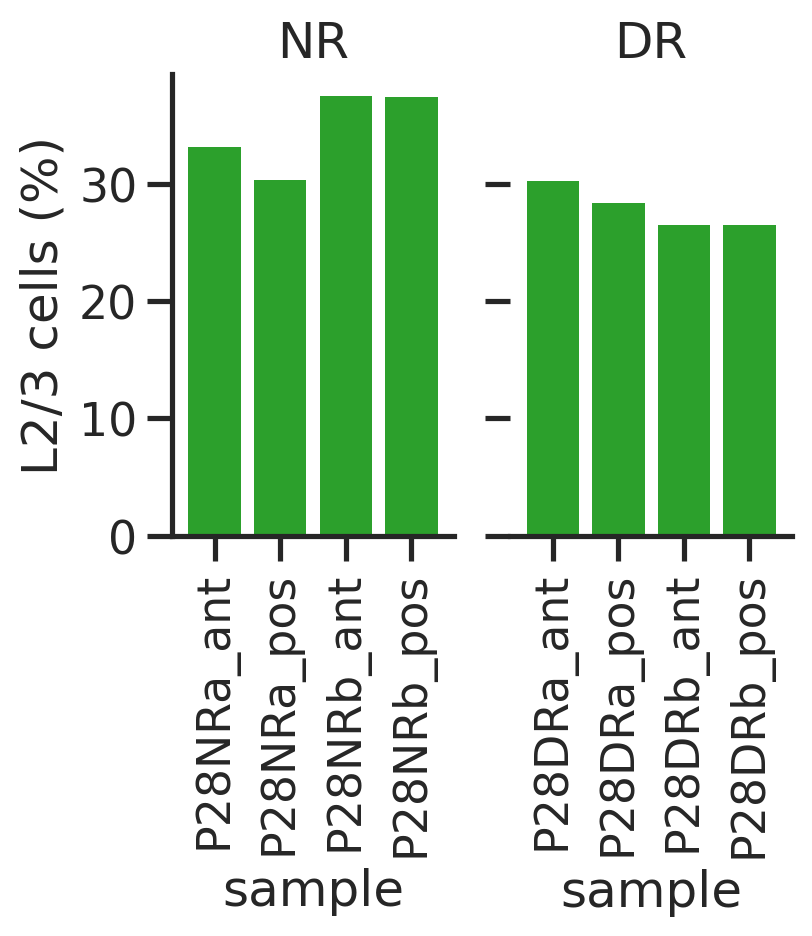

In [39]:
for i, lbl in enumerate(['A', 'B', 'C']):
    fig, axs = plt.subplots(1, 2, figsize=(4,3), sharey=True)
    ax = axs[0]
    res.loc[names[:4]][lbl].plot.bar(ax=ax, stacked=False, width=0.8, edgecolor='none', color=f'C{i}', legend=False)
    ax.grid(False)
    sns.despine(ax=ax)
    ax.set_title('NR')
    ax.set_ylabel('L2/3 cells (%)')

    ax = axs[1]
    res.loc[names[4:]][lbl].plot.bar(ax=ax, stacked=False, width=0.8, edgecolor='none', color=f'C{i}')
    ax.grid(False)
    sns.despine(ax=ax, left=True)
    ax.set_title('DR')


    plt.show()

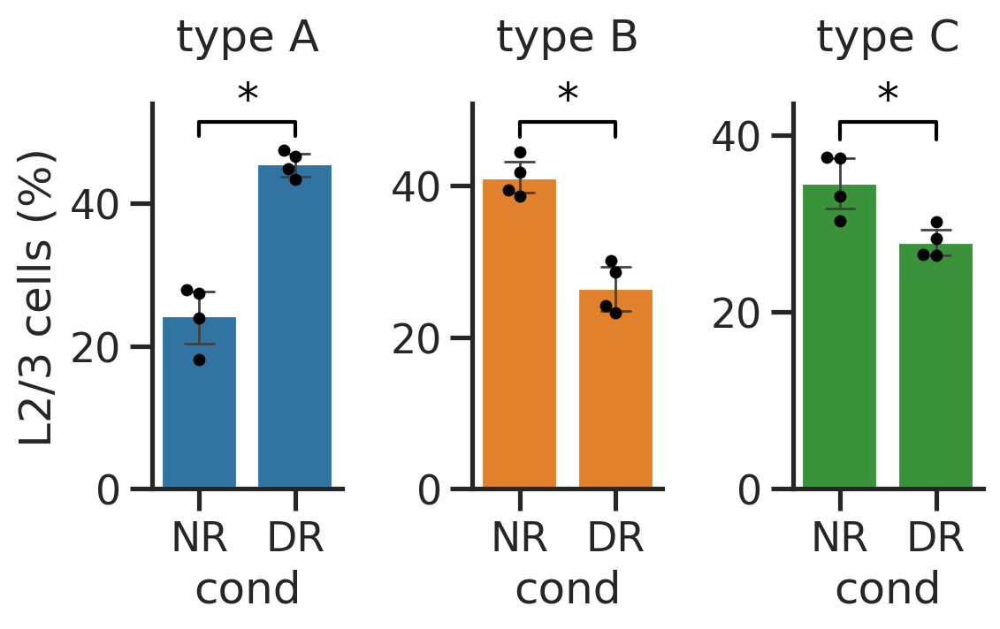

In [40]:
fig, axs = plt.subplots(1, 3, figsize=(2*3,4))
for ax, col, color in zip(axs, ['A', 'B', 'C'], ['C0', 'C1', 'C2']):
    sns.barplot(data=res, x='cond', y=col, ax=ax, color=color, capsize=0.3, errwidth=1)
    sns.swarmplot(data=res, x='cond', y=col, color='k', ax=ax, )
    ax.set_title(f'type {col}', y=1.1)
    sns.despine(ax=ax)
    ax.grid(False)
    ax.set_ylabel('')
    
    a = res[res['cond']=='NR'][col]/100
    b = res[res['cond']=='DR'][col]/100
    s, p = stats.mannwhitneyu(a, b)
    
    if p > 0.05:
        mark = 'ns'
    elif p < 0.05 and p > 0.001:
        mark = '*'
    elif p < 0.001:
        mark = '***'
    
    # statistical annotation
    x1, x2 = 0, 1   
    y, h = res[col].max() + 2, 2
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c='k')
    ax.text((x1+x2)*.5, y+h, mark, ha='center', va='bottom', color='k')
    
axs[0].set_ylabel('L2/3 cells (%)')
fig.tight_layout()
plt.show()

In [41]:
res = []
for sample in names:
    if 'NR' in sample:
        cond = 'NR'
    elif 'DR' in sample:
        cond = 'DR'
        
    adatasub = adata[adata.obs['sample']==sample]
    depths = adatasub.obs['depth'].values
    g_size = adatasub.obsm['size_freq_abc'][:,0]
    g_sum  = adatasub.obsm['size_freq_abc'][:,4]
    freq_a = adatasub.obsm['size_freq_abc'][:,1]
    freq_b = adatasub.obsm['size_freq_abc'][:,2]
    freq_c = adatasub.obsm['size_freq_abc'][:,3]

    # ta = np.sum(g_size*(freq_a))
    # tb = np.sum(g_size*(freq_b))
    # tc = np.sum(g_size*(freq_c))
    ta = np.sum(g_sum*(freq_a))
    tb = np.sum(g_sum*(freq_b))
    tc = np.sum(g_sum*(freq_c))
    tt = (ta+tb+tc)
    print(sample, f'{ta/tt: .2f}', f'{tb/tt: .2f}', f'{tc/tt: .2f}')
    res.append([sample, cond, ta/tt*100, tb/tt*100, tc/tt*100])
    
res = pd.DataFrame(res, columns=['sample', 'cond', 'A', 'B', 'C']).set_index('sample')

P28NRa_ant  0.27  0.39  0.33
P28NRa_pos  0.28  0.42  0.30
P28NRb_ant  0.18  0.44  0.38
P28NRb_pos  0.24  0.39  0.37
P28DRa_ant  0.47  0.23  0.30
P28DRa_pos  0.47  0.24  0.28
P28DRb_ant  0.43  0.30  0.26
P28DRb_pos  0.45  0.29  0.26


In [42]:
for sample in names:
    adatasub = adata[adata.obs['sample']==sample]
    g_size = adatasub.obsm['size_freq_abc'][:,0]
    g_sum  = adatasub.obsm['size_freq_abc'][:,4]
    freq_a = adatasub.obsm['size_freq_abc'][:,1]
    freq_b = adatasub.obsm['size_freq_abc'][:,2]
    freq_c = adatasub.obsm['size_freq_abc'][:,3]

    # ta = np.sum(g_size*(freq_a))
    # tb = np.sum(g_size*(freq_b))
    # tc = np.sum(g_size*(freq_c))
    ta = np.sum(g_size*(freq_a))
    tb = np.sum(g_size*(freq_b))
    tc = np.sum(g_size*(freq_c))
    tt = (ta+tb+tc)
    print(sample, f'{ta/tt: .2f}', f'{tb/tt: .2f}', f'{tc/tt: .2f}')

P28NRa_ant  0.27  0.40  0.33
P28NRa_pos  0.27  0.41  0.32
P28NRb_ant  0.18  0.44  0.38
P28NRb_pos  0.24  0.38  0.38
P28DRa_ant  0.45  0.21  0.33
P28DRa_pos  0.48  0.23  0.29
P28DRb_ant  0.43  0.29  0.28
P28DRb_pos  0.45  0.27  0.29


In [43]:
for sample in names:
    adatasub = adata[adata.obs['sample']==sample]
    g_size = adatasub.obsm['size_freq_abc'][:,0]
    g_sum  = adatasub.obsm['size_freq_abc'][:,4]
    freq_a = adatasub.obsm['size_freq_abc'][:,1]
    freq_b = adatasub.obsm['size_freq_abc'][:,2]
    freq_c = adatasub.obsm['size_freq_abc'][:,3]

    rank = np.argsort(np.vstack([freq_a,freq_b,freq_c]).T, axis=1)[:,-1]
    ta = np.sum(rank==0)
    tb = np.sum(rank==1)
    tc = np.sum(rank==2)
    tt = len(g_size)
    print(sample, f'{ta/tt: .2f}', f'{tb/tt: .2f}', f'{tc/tt: .2f}')

P28NRa_ant  0.23  0.38  0.39
P28NRa_pos  0.22  0.40  0.38
P28NRb_ant  0.13  0.41  0.46
P28NRb_pos  0.20  0.36  0.44
P28DRa_ant  0.41  0.15  0.44
P28DRa_pos  0.37  0.20  0.44
P28DRb_ant  0.33  0.21  0.46
P28DRb_pos  0.38  0.21  0.41


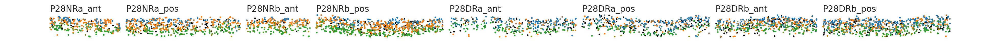

In [44]:
x =  adata.obs['width_show2']
y =  adata.obs['depth_show2']

g_size = adata.obsm['size_freq_abc'][:,0]
freq_a = adata.obsm['size_freq_abc'][:,1]
freq_b = adata.obsm['size_freq_abc'][:,2]
freq_c = adata.obsm['size_freq_abc'][:,3]

# visualize ABC scores using additive blending
additive = (cmap_a(freq_a)+cmap_b(freq_b)+cmap_c(freq_c))[:,:3]

fig, ax = plt.subplots(1,1,figsize=(1*25,1))
for lbl, coord in width_cum.items():
    ax.text(coord, 0, lbl, fontsize=12)
    
sorting = np.argsort(np.max(additive, axis=1))# [::-1]
p = ax.scatter(x[sorting], y[sorting], c=additive[sorting], s=5, edgecolor='none') # , alpha=g_size[sorting])
# cond = np.max(additive, axis=1) > 1e-5
# p = ax.scatter(x[cond], y[cond], c=normed[cond], s=1, edgecolor='none')
ax.set_aspect('equal')
ax.axis('off')

plt.show()

# visualize FISH

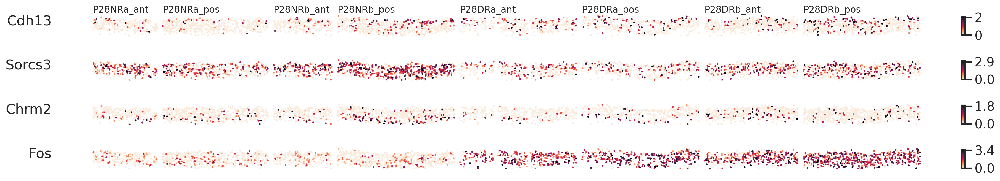

In [45]:
gns = ['Cdh13', 'Sorcs3', 'Chrm2', 'Fos'] 
x =  adata.obs['width_show2']
y =  adata.obs['depth_show2']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*25,n*1))
for i, (ax, gn) in enumerate(zip(axs, gns)):
    if i == 0:
        for lbl, coord in width_cum.items():
            ax.text(coord, 0, lbl, fontsize=12)
    
    g = np.log2(1+adata[:,gn].layers['jnorm'].reshape(-1,))
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    sorting = np.argsort(g)
    
    p = utils_merfish.st_scatter_ax(fig, ax,  x[sorting],  y[sorting],  gexp=g[sorting], s=5, title='', vmin=vmin, vmax=vmax, cmap='rocket_r')
    ax.set_title(gn, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
plt.show()
    

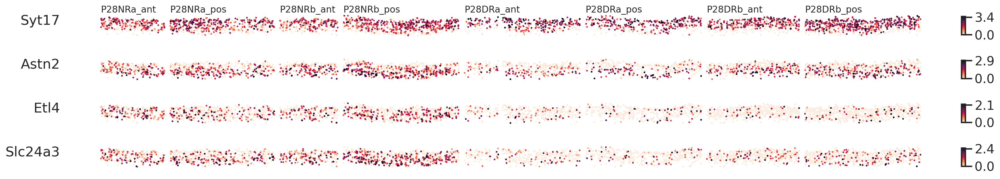

In [46]:
gns = ['Syt17', 'Astn2', 'Etl4', 'Slc24a3'] 
x =  adata.obs['width_show2']
y =  adata.obs['depth_show2']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*25,n*1))
for i, (ax, gn) in enumerate(zip(axs, gns)):
    if i == 0:
        for lbl, coord in width_cum.items():
            ax.text(coord, 0, lbl, fontsize=12)
    
    g = np.log2(1+adata[:,gn].layers['jnorm'].reshape(-1,))
    vmax = np.percentile(g, 99)
    vmin = np.percentile(g,  5)
    sorting = np.argsort(g)
    
    p = utils_merfish.st_scatter_ax(fig, ax,  x[sorting],  y[sorting],  gexp=g[sorting], s=5, title='', vmin=vmin, vmax=vmax, cmap='rocket_r')
    ax.set_title(gn, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
plt.show()
    

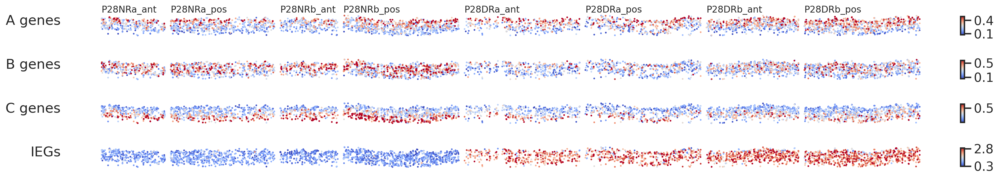

In [47]:
x =  adata.obs['width_show2']
y =  adata.obs['depth_show2']
gns = [agenes, bgenes, cgenes, iegs] 
titles = ['A genes', 'B genes', 'C genes', 'IEGs']
n = len(gns)

fig, axs = plt.subplots(n,1,figsize=(1*25,n*1))
for i, (ax, gn, title) in enumerate(zip(axs, gns, titles)):
    if i == 0:
        for lbl, coord in width_cum.items():
            ax.text(coord, 0, lbl, fontsize=12)
    
    g = adata[:,gn].layers['ljnorm'].mean(axis=1)
    sorting = np.argsort(g)
    
    vmin = np.percentile(g,  5)
    vmax = np.percentile(g, 95)
    p = utils_merfish.st_scatter_ax(fig, ax, x[sorting], y[sorting], gexp=g[sorting], 
                                    s=5, title='', vmin=vmin, vmax=vmax, cmap='coolwarm') #, axis_off=False)
    ax.set_title(title, loc='left', va='center', ha='right', y=0.5, pad=None)
    fig.colorbar(p, pad=0, shrink=0.5, aspect=5, ticks=[np.round(vmin, decimals=1), np.round(vmax-0.1, decimals=1)])
    
plt.show()
    

# stats

In [48]:
stats = {}
bins = np.linspace(0, 400, 12)

for name in names:
    adatasub = adata[adata.obs['sample']==name]# v1l23_data[name]
    lnorm_mean, lnorm_sem, lnorm_std, n, d, db = binning_pipe2(adatasub, 'depth', 'ljnorm', bins=bins)
    stats[name] = (lnorm_mean, lnorm_sem, lnorm_std, n, d, db)
d.value_counts()

(0.0, 36.364]           0
(36.364, 72.727]        5
(72.727, 109.091]      33
(109.091, 145.455]    124
(145.455, 181.818]    139
(181.818, 218.182]    183
(218.182, 254.545]    131
(254.545, 290.909]    149
(290.909, 327.273]     99
(327.273, 363.636]     68
(363.636, 400.0]       36
dtype: int64

In [49]:
# mean expression level across V1 L2/3 in NR
base_a0 = []
base_b0 = []
base_c0 = []
base_i0 = []
for name in [
    'P28NRa_ant', 'P28NRa_pos', 'P28NRb_ant', 'P28NRb_pos',]:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    base_a = np.mean(lnorm_mean.iloc[:,agenes_idx], axis=0) # across depth bins for each gene
    base_b = np.mean(lnorm_mean.iloc[:,bgenes_idx], axis=0) # across depth bins for each gene
    base_c = np.mean(lnorm_mean.iloc[:,cgenes_idx], axis=0) # across depth bins for each gene
    base_i = np.mean(lnorm_mean.iloc[:,igenes_idx], axis=0) # across depth bins for each gene
    
    base_a0.append(base_a)
    base_b0.append(base_b)
    base_c0.append(base_c)
    base_i0.append(base_i)
    
base_a0 = np.mean(base_a0, axis=0)
base_b0 = np.mean(base_b0, axis=0)
base_c0 = np.mean(base_c0, axis=0)
base_i0 = np.mean(base_i0, axis=0)

base_a0.shape, base_b0.shape, base_c0.shape, base_i0.shape

((64,), (35,), (71,), (16,))

In [50]:
means = {}
sems = {}
for name in names:
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    
    amean = np.mean(lnorm_mean.iloc[:,agenes_idx]-base_a0, axis=1) # a bin vector
    bmean = np.mean(lnorm_mean.iloc[:,bgenes_idx]-base_b0, axis=1) # a bin vector
    cmean = np.mean(lnorm_mean.iloc[:,cgenes_idx]-base_c0, axis=1) # a bin vector
    imean = np.mean(lnorm_mean.iloc[:,igenes_idx]-base_i0, axis=1) # a bin vector
    
    asem = np.mean(lnorm_sem.iloc[:,agenes_idx], axis=1)
    bsem = np.mean(lnorm_sem.iloc[:,bgenes_idx], axis=1)
    csem = np.mean(lnorm_sem.iloc[:,cgenes_idx], axis=1)
    isem = np.mean(lnorm_sem.iloc[:,igenes_idx], axis=1)
    
    means[name] = [amean, bmean, cmean, imean]
    sems[name] = [asem, bsem, csem, isem]
    

In [51]:
midpoints = np.mean(np.vstack([bins[:-1], bins[1:]]), axis=0)
midpoints

array([ 18.18181818,  54.54545455,  90.90909091, 127.27272727,
       163.63636364, 200.        , 236.36363636, 272.72727273,
       309.09090909, 345.45454545, 381.81818182])

In [52]:
names

['P28NRa_ant',
 'P28NRa_pos',
 'P28NRb_ant',
 'P28NRb_pos',
 'P28DRa_ant',
 'P28DRa_pos',
 'P28DRb_ant',
 'P28DRb_pos']

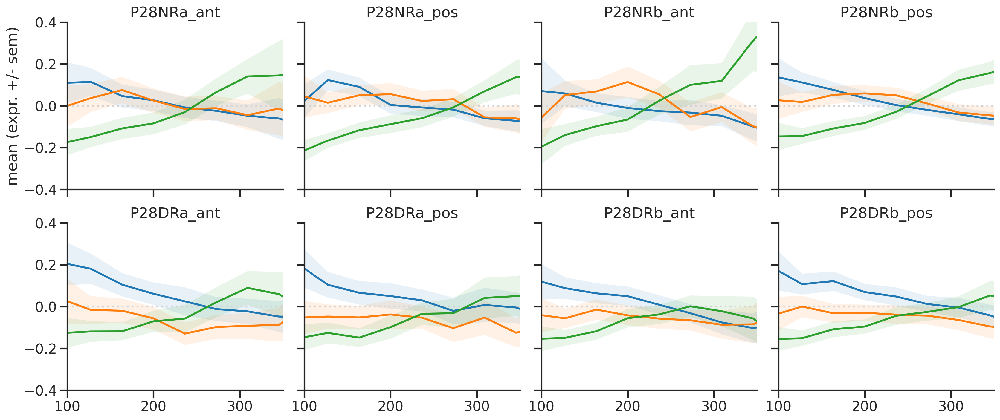

In [53]:
gnames = ['A genes (n=64)', 'B genes (n=35)', 'C genes (n=71)']

fig, axs = plt.subplots(2, 4, figsize=(5*4,4*2), sharex=True, sharey=True)

# ax.set_title('P28NR')
linestyle = '-'
for ax, name in zip(axs.flat, names):
    # (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    amean, bmean, cmean, imean = means[name]
    asem, bsem, csem, isem = sems[name]
    
    x = midpoints
    ax.plot(x, amean, label='A genes', color='C0', linestyle=linestyle)
    ax.fill_between(x, amean-asem, amean+asem, color='C0', alpha=0.1, edgecolor='none')
    ax.plot(x, bmean, label='B genes', color='C1', linestyle=linestyle)
    ax.fill_between(x, bmean-bsem, bmean+bsem, color='C1', alpha=0.1, edgecolor='none')
    ax.plot(x, cmean, label='C genes', color='C2', linestyle=linestyle)
    ax.fill_between(x, cmean-csem, cmean+csem, color='C2', alpha=0.1, edgecolor='none')
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_ylim([-0.4, 0.4])
    ax.grid(False)
    ax.set_title(name)
axs.flat[0].set_ylabel('mean (expr. +/- sem)')

    
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')

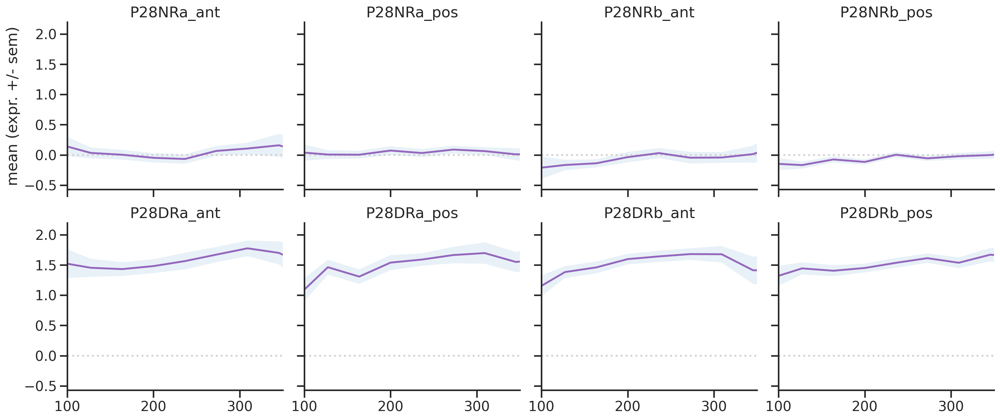

In [54]:
gnames = ['IEGs']

fig, axs = plt.subplots(2, 4, figsize=(5*4,4*2), sharex=True, sharey=True)

# ax.set_title('P28NR')
linestyle = '-'
for ax, name in zip(axs.flat, names):
    (lnorm_mean, lnorm_sem, lnorm_std, n, d, db) = stats[name]
    amean, bmean, cmean, imean = means[name]
    asem, bsem, csem, isem = sems[name]
    
    x = midpoints
    ax.plot(x, imean, label='IEGs', color='C4', linestyle=linestyle)
    ax.fill_between(x, imean-isem, imean+isem, color='C0', alpha=0.1, edgecolor='none')
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    # ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(name)
axs.flat[0].set_ylabel('mean (expr. +/- sem)')

    
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')

In [55]:
samp_gene_dpth_mat = np.array([np.array(means[name]) for name in names]) 
print(samp_gene_dpth_mat.shape) # sample, gene group, depth

nr_mat = samp_gene_dpth_mat[:4]
nr_mean = np.mean(nr_mat, axis=0) # gene group, depth
nr_sem  = np.std(nr_mat, axis=0)/np.sqrt(4) # gene group, depth

dr_mat = samp_gene_dpth_mat[4:]
dr_mean = np.mean(dr_mat, axis=0) # gene group, depth
dr_sem  = np.std(dr_mat, axis=0)/np.sqrt(4) # gene group, depth
nr_mean.shape, dr_mean.shape

(8, 4, 11)


((4, 11), (4, 11))

In [56]:
# t-test between NR and DR for each gene group and each location
from scipy import stats
from statsmodels.stats.multitest import multipletests

ts, ps = stats.ttest_ind(nr_mat, dr_mat)
rejs, qs, _, _ = multipletests(np.nan_to_num(ps, nan=1).reshape(-1,), alpha=0.05, method='fdr_bh')
qs = qs.reshape(ps.shape)
nrdr_mean = np.stack([nr_mean, dr_mean], axis=2).mean(axis=2)

In [57]:
# nr_bio_mat = np.stack([
#     np.mean(samp_gene_dpth_mat[0:2], axis=0),
#     np.mean(samp_gene_dpth_mat[2:4], axis=0),
#     ], axis=0)
# dr_bio_mat = np.stack([
#     np.mean(samp_gene_dpth_mat[4:6], axis=0),
#     np.mean(samp_gene_dpth_mat[6:8], axis=0),
#     ], axis=0)
# ts, ps = stats.ttest_ind(nr_bio_mat, dr_bio_mat)
# qs = ps
# rejs, qs, _, _ = multipletests(np.nan_to_num(ps, nan=1).reshape(-1,), alpha=0.05, method='fdr_bh')
# qs = qs.reshape(ps.shape)
# nrdr_mean = np.stack([nr_mean, dr_mean], axis=2).mean(axis=2)

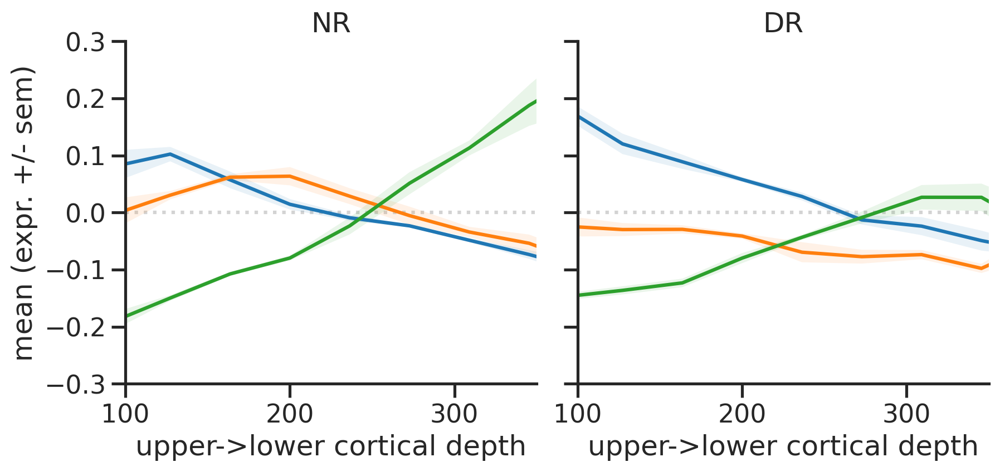

In [58]:
titles = ['NR', 'DR']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['A genes', 'B genes', 'C genes']
colors = ['C0', 'C1', 'C2']

fig, axs = plt.subplots(1, 2, figsize=(5*2,4), sharex=True, sharey=True)
for ax, cond_mean, cond_sem, title in zip(axs, data_mean, data_sem, titles):
    # ax.set_title('P28NR')
    linestyle = '-'
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for i, (gname, color) in enumerate(zip(gnames, colors)):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(title)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()

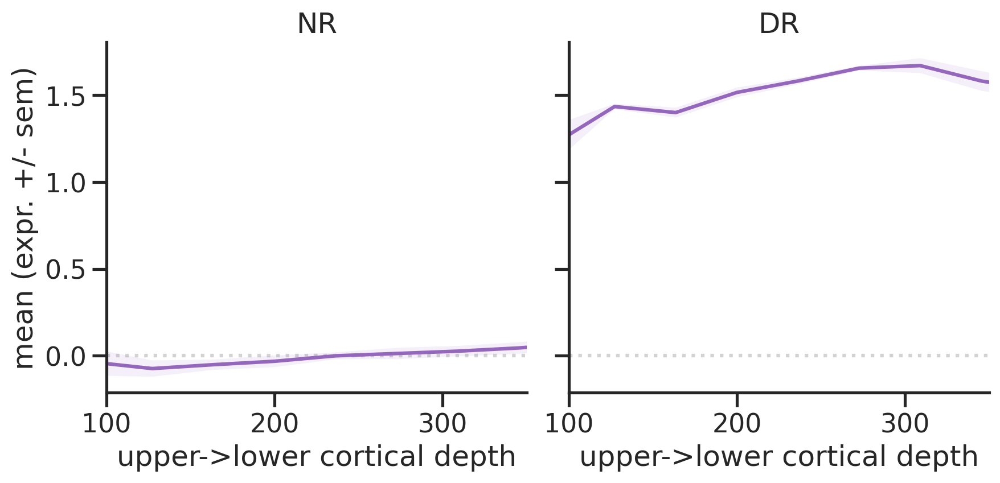

In [59]:

titles = ['NR', 'DR']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['IEGs']
colors = ['C4']
i = 3

fig, axs = plt.subplots(1, 2, figsize=(5*2,4), sharex=True, sharey=True)
for ax, cond_mean, cond_sem, title in zip(axs, data_mean, data_sem, titles):
    # ax.set_title('P28NR')
    linestyle = '-'
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for (gname, color) in zip(gnames, colors):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300])
    ax.set_xlim(left=100, right=350)
    # ax.set_ylim([-0.3, 0.3])
    ax.grid(False)
    ax.set_title(title)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()

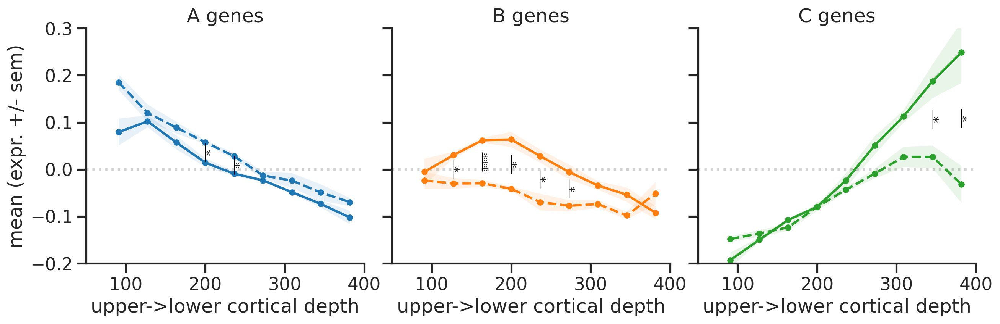

In [60]:
linestyles = ['-', '--']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['A genes', 'B genes', 'C genes']
titles = gnames
colors = ['C0', 'C1', 'C2']
labels = ['NR', 'DR']
sigs = qs
allmeans = nrdr_mean

fig, axs = plt.subplots(1, 3, figsize=(5*3,4), sharex=True, sharey=True)
for i, (ax, gname, color) in enumerate(zip(axs, gnames, colors)):
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for cond_mean, cond_sem, title, linestyle in zip(data_mean, data_sem, titles, linestyles):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle, marker='o', markersize=5)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')
        
    for _x, _y, _sig in zip(midpoints, allmeans[i], sigs[i]):
        if _sig < 1e-3:
            ax.text(_x, _y, "***", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.02, _y+0.02, color='k', linewidth=0.5)
        elif _sig < 5e-2:
            ax.text(_x, _y, "*", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.02, _y+0.02, color='k', linewidth=0.5)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300, 400])
    ax.set_xlim(left=50, right=400)
    ax.set_ylim([-0.2, 0.3])
    ax.grid(False)
    ax.set_title(gname)
    ax.set_xlabel('upper->lower cortical depth')
    
axs[0].set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()

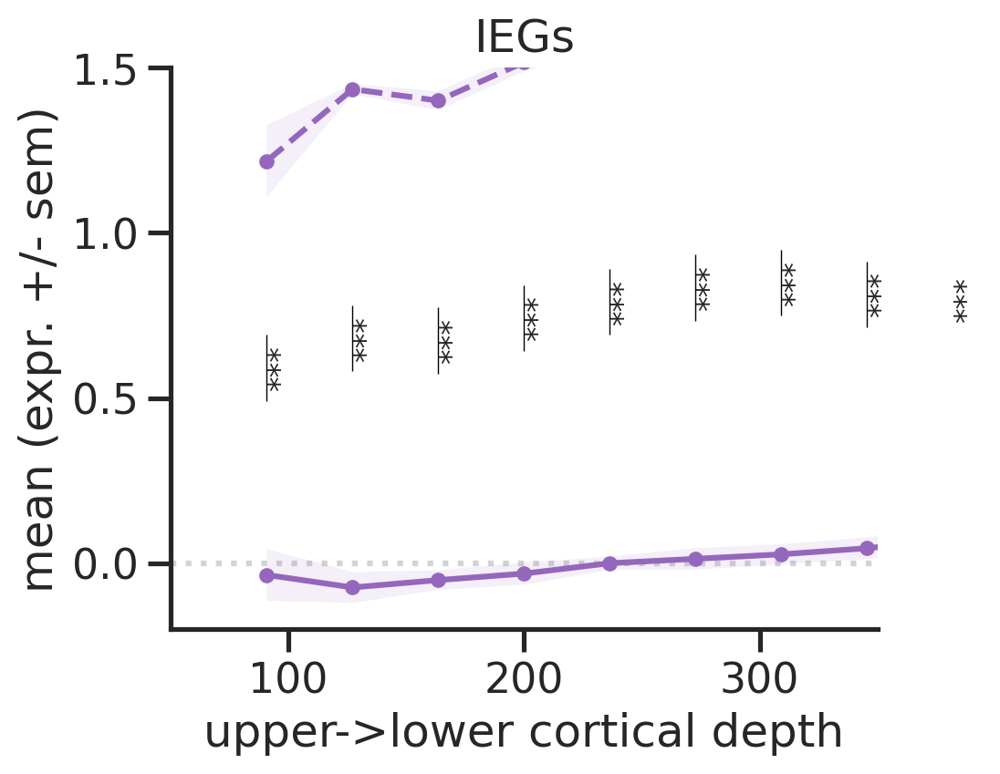

In [61]:
linestyles = ['-', '--']
data_mean = [nr_mean, dr_mean]
data_sem = [nr_sem, dr_sem]
gnames = ['IEGs']
titles = gnames
colors = ['C4']
labels = ['NR', 'DR']
i = 3
sigs = qs
allmeans = nrdr_mean

fig, ax = plt.subplots(1, 1, figsize=(5*1,4), sharex=True, sharey=True)
for (gname, color) in zip(gnames, colors):
    ax.axhline(color='lightgray', linestyle='dotted', zorder=1)
    for cond_mean, cond_sem, linestyle in zip(data_mean, data_sem, linestyles):
        ax.plot(midpoints, cond_mean[i], label=gname, color=color, linestyle=linestyle, marker='o', markersize=5)
        ax.fill_between(midpoints, cond_mean[i]-cond_sem[i], cond_mean[i]+cond_sem[i], color=color, alpha=0.1, edgecolor='none')
        
    for _x, _y, _sig in zip(midpoints, allmeans[i], sigs[i]):
        if _sig < 1e-3:
            ax.text(_x, _y, "***", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.1, _y+0.1, color='k', linewidth=0.5)
        elif _sig < 5e-2:
            ax.text(_x, _y, "*", ha='left', va='center', fontsize=12, rotation=90)
            ax.vlines(_x, _y-0.1, _y+0.1, color='k', linewidth=0.5)

    sns.despine(ax=ax)
    ax.set_xticks([0, 100, 200, 300, 400])
    ax.set_xlim(left=50, right=350)
    ax.set_ylim([-0.2, 1.5])
    ax.grid(False)
    ax.set_title(gname)
    ax.set_xlabel('upper->lower cortical depth')
    
ax.set_ylabel('mean (expr. +/- sem)')
fig.subplots_adjust(wspace=0.1)
# powerplots.savefig_autodate(fig, outdatadir+'/grant_saumya_lineq_abc_v3.pdf')
plt.show()